In [3]:
import numpy as np
import cv2 as cv2
from matplotlib import pyplot as plt
from os import listdir
from os.path import isfile, join

In [4]:
def show_page(img):
    plt.figure(figsize=(30, 30))
    plt.imshow(img, 'gray')
    plt.show()
    
    
def get_names_from_dir(path):
    onlyfiles = [f for f in listdir(path) if isfile(join(path, f))]
    return onlyfiles


def extract_page(img):
    """returns only page crop from whole image"""
    blur = cv2.GaussianBlur(img,(5,5),0)
    _,otsu_img = cv2.threshold(blur,200,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    kernel = np.ones((10, 10), np.uint8)
    erosion = cv2.erode(otsu_img, kernel, iterations=5)

    ind = np.argwhere(erosion == 255)
    top_left = np.min(ind[:, 0]),np.min(ind[:, 1]) 
    right_bottom = np.max(ind[:, 0]), np.max(ind[:, 1]) 
    page = img[top_left[0]:right_bottom[0] , top_left[1]:right_bottom[1]]
    return page


def find_text(page):
    """returns page with bounding boxes around text"""
    blur = cv2.GaussianBlur(page,(1,1),0)
    _,binary_page = cv2.threshold(blur,127,255,cv2.THRESH_TRUNC+cv2.THRESH_OTSU)
    kernel = np.ones((2,2), np.uint8) 
    page_dilation = cv2.dilate(binary_page, kernel, iterations=2)
    kernel = np.ones((5,5), np.uint8) 
    page_erosion = cv2.erode(page_dilation, kernel, iterations=20)
    _,page_erosion_thresh = cv2.threshold(page_erosion, 100, 255, cv2.THRESH_BINARY_INV)

    cnts,_ = cv2.findContours(page_erosion_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for c in cnts:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(page, (x, y), (x + w, y + h), (0,0,0), 2)
    return page_erosion_thresh

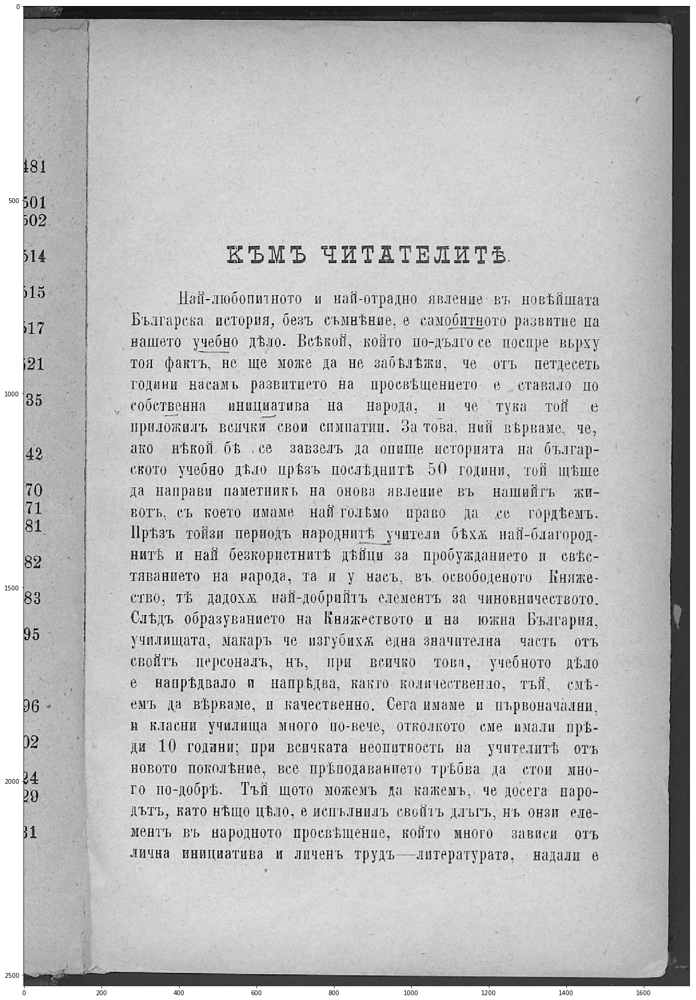

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


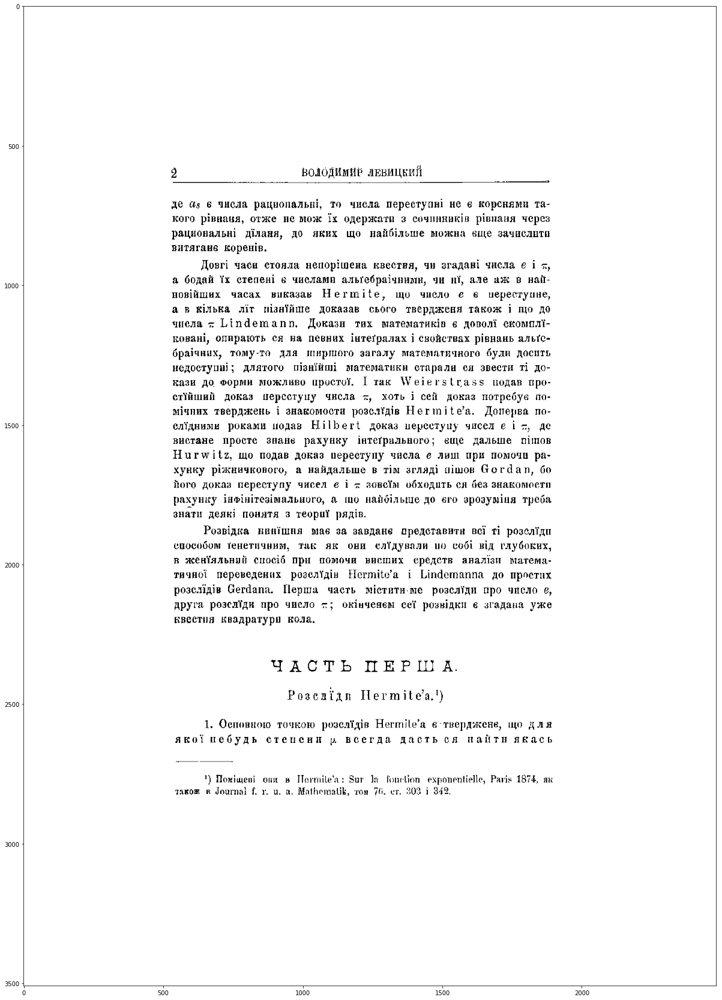

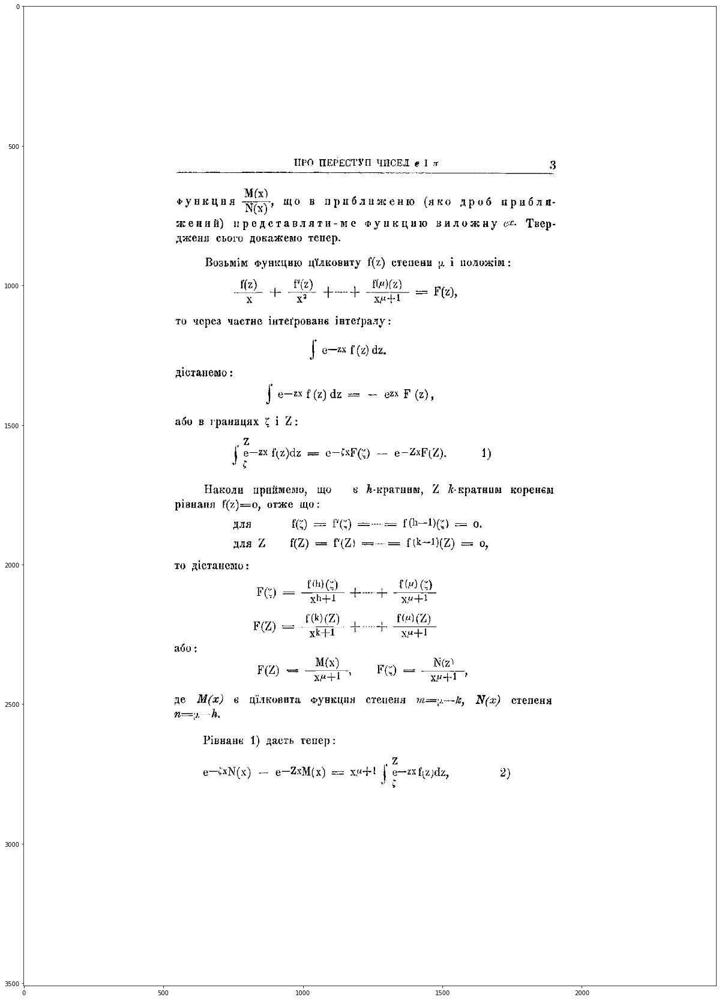

In [5]:
file_names = get_names_from_dir('data/')
images =  []
for name in file_names:
    img = cv2.imread('data/'+name, cv2.IMREAD_GRAYSCALE)
    images.append(img)
    show_page(img)

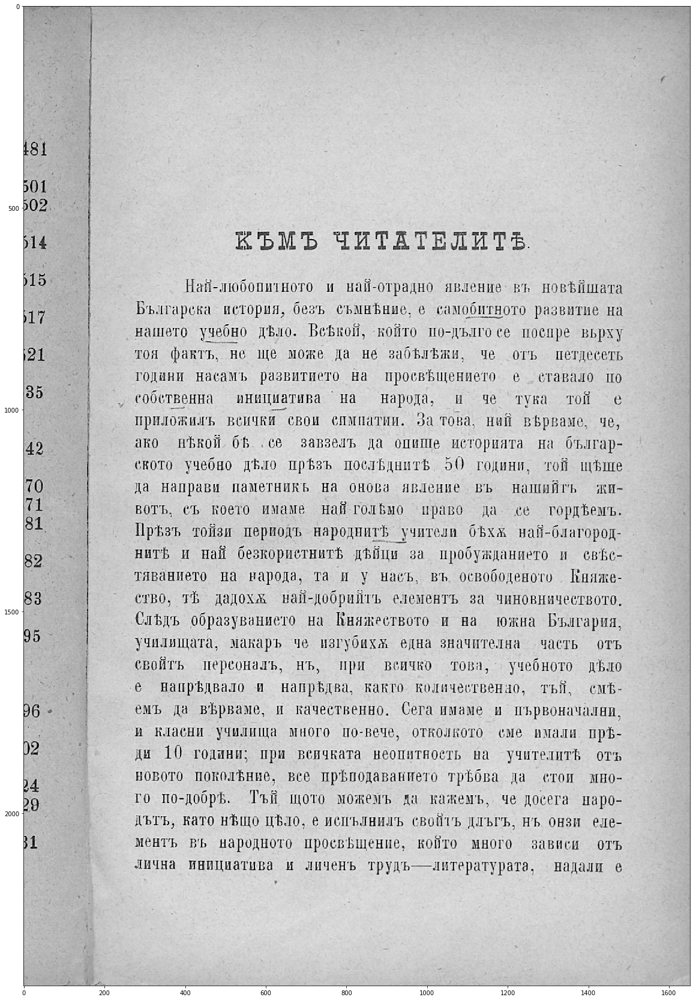

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


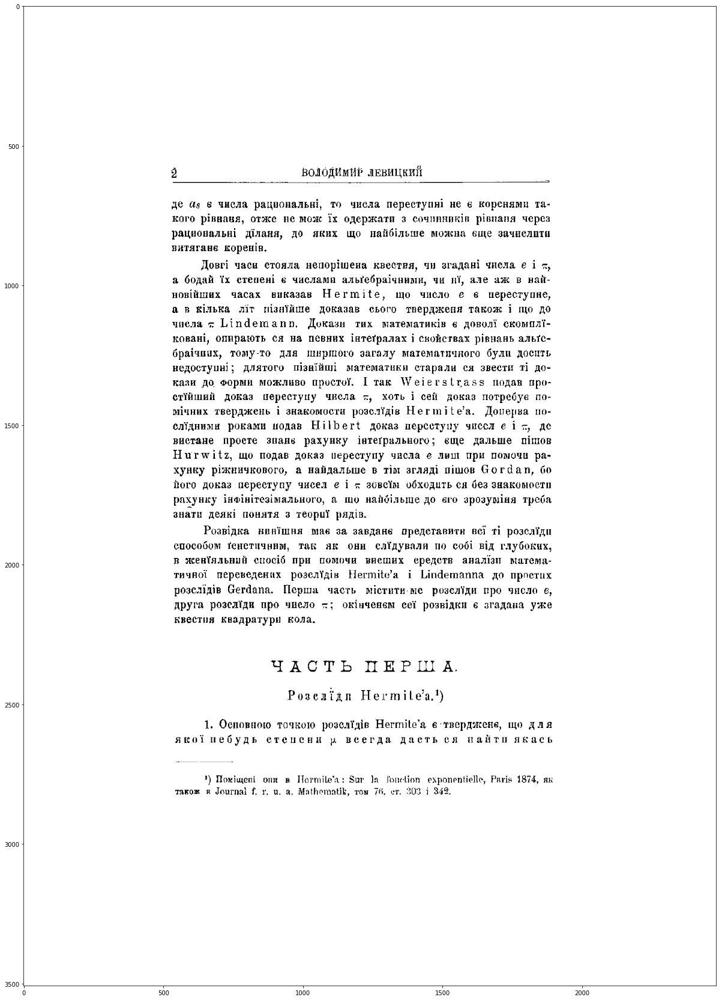

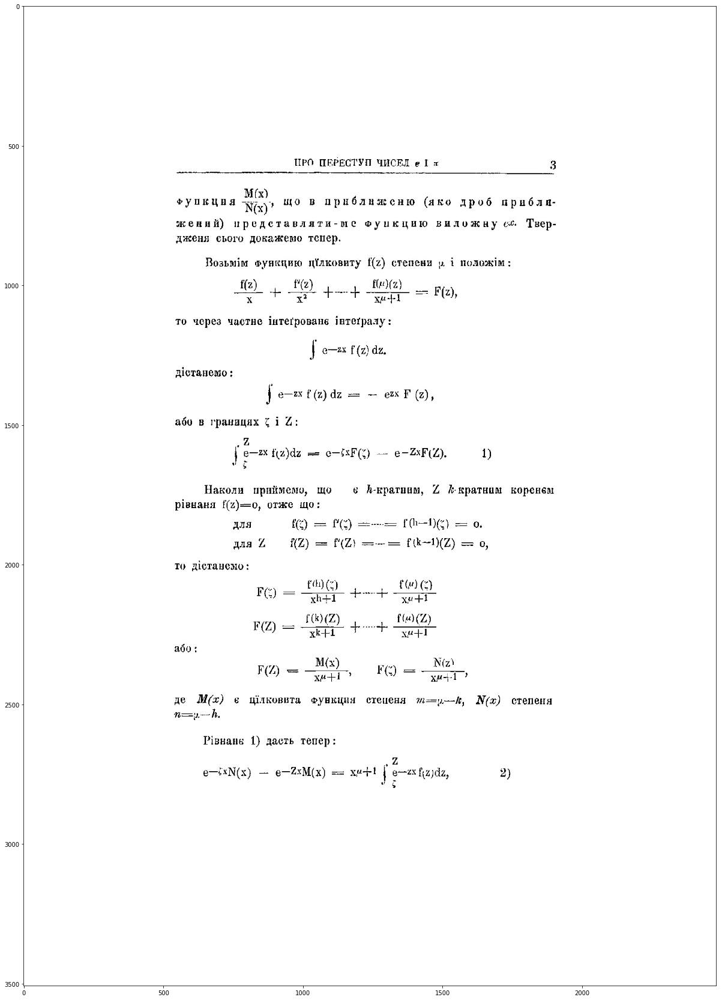

In [6]:
# crop images to pages
pages = [extract_page(img) for img in images]
for page in pages:
    show_page(page)

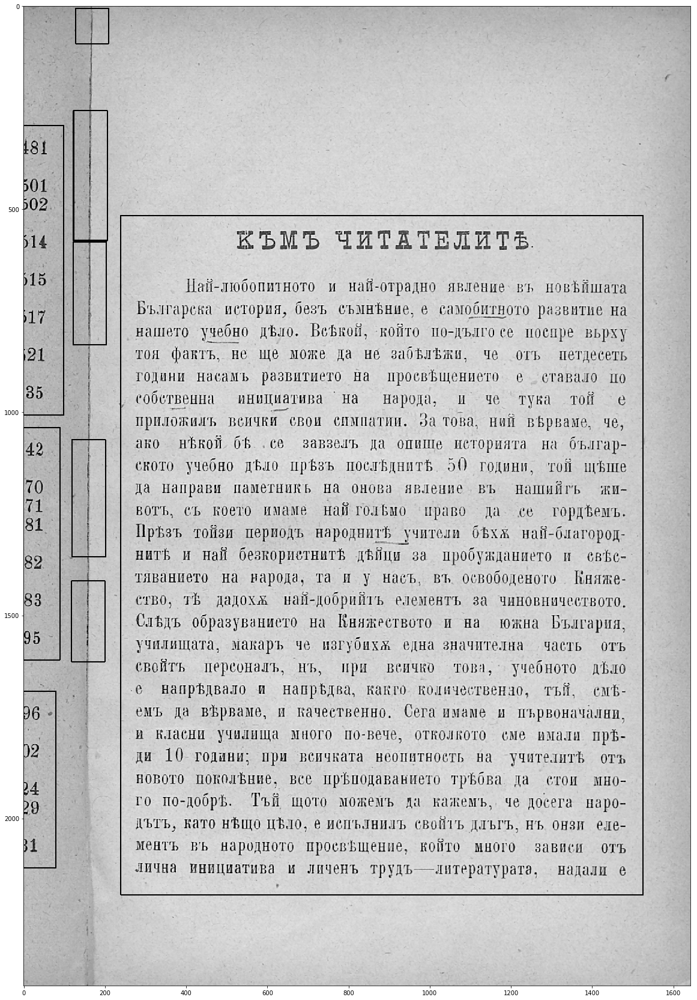

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


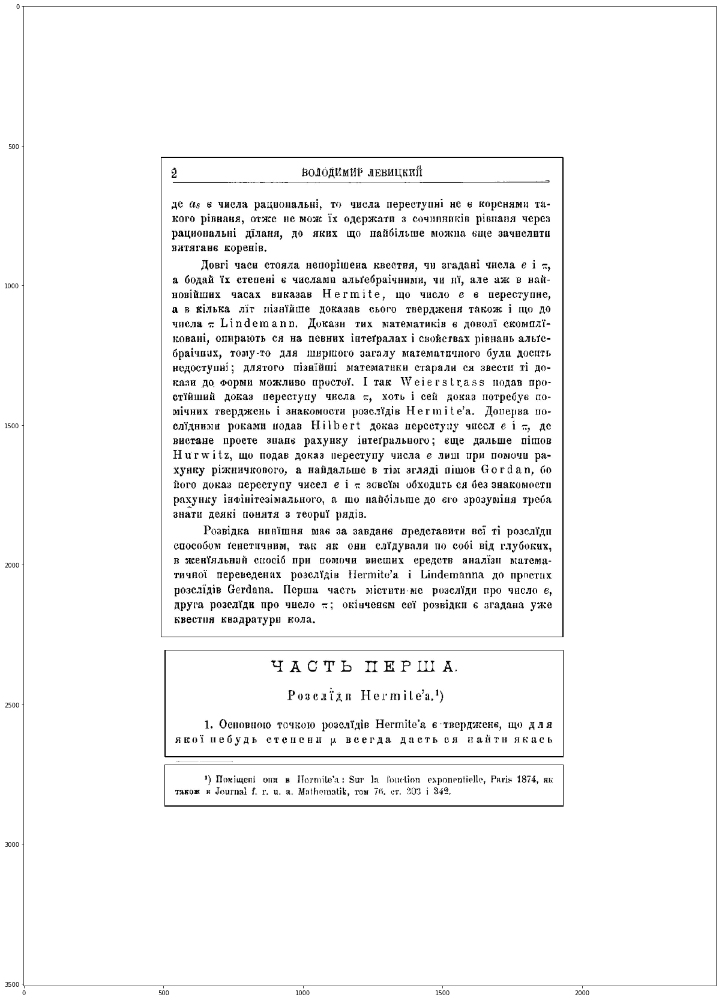

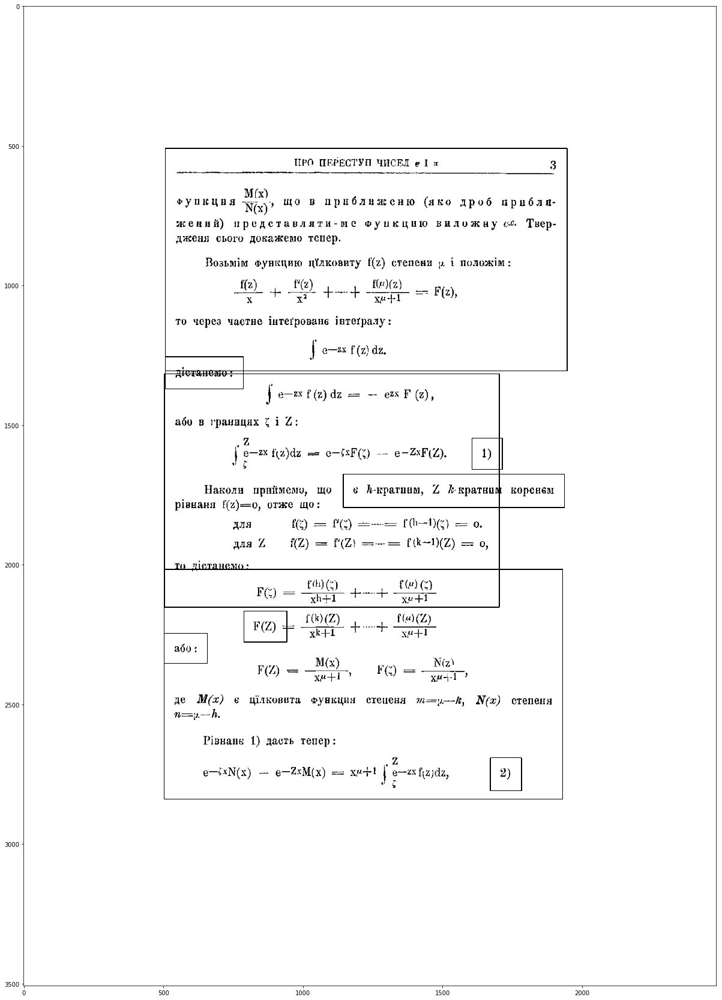

In [5]:
# find text fields on page
for page in pages:
    find_text(page)
    show_page(page)